In [1]:
%pylab inline
import pandas
import seaborn

Populating the interactive namespace from numpy and matplotlib


In [2]:
data = pandas.read_csv('uber-raw-data-apr14.csv')

In [3]:
len(data)

99997

In [4]:
data.tail()

,Date/Time,Lat,Lon,Base
99992,4/13/2014 8:55:00,40.8277,-73.8305,B02598
99993,4/13/2014 8:55:00,40.7321,-74.0023,B02598
99994,4/13/2014 8:55:00,40.7772,-73.9621,B02598
99995,4/13/2014 8:56:00,40.8121,-73.9599,B02598
99996,4/13/2014 8:57:00,40.7264,-73.9553,B02598


In [5]:
data['Date/Time'] = data['Date/Time'].map(pandas.to_datetime)

In [6]:
data.tail()

,Date/Time,Lat,Lon,Base
99992,2014-04-13 08:55:00,40.8277,-73.8305,B02598
99993,2014-04-13 08:55:00,40.7321,-74.0023,B02598
99994,2014-04-13 08:55:00,40.7772,-73.9621,B02598
99995,2014-04-13 08:56:00,40.8121,-73.9599,B02598
99996,2014-04-13 08:57:00,40.7264,-73.9553,B02598


In [7]:
def get_dom(dt):
    return dt.day

data['dom'] = data['Date/Time'].map(get_dom)

def get_weekday(dt):
    return dt.weekday()

data['weekday'] = data['Date/Time'].map(get_weekday)

def get_hour(dt):
    return dt.hour

data['hour'] = data['Date/Time'].map(get_hour)

data.tail()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
99992,2014-04-13 08:55:00,40.8277,-73.8305,B02598,13,6,8
99993,2014-04-13 08:55:00,40.7321,-74.0023,B02598,13,6,8
99994,2014-04-13 08:55:00,40.7772,-73.9621,B02598,13,6,8
99995,2014-04-13 08:56:00,40.8121,-73.9599,B02598,13,6,8
99996,2014-04-13 08:57:00,40.7264,-73.9553,B02598,13,6,8


In [8]:
data.tail()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
99992,2014-04-13 08:55:00,40.8277,-73.8305,B02598,13,6,8
99993,2014-04-13 08:55:00,40.7321,-74.0023,B02598,13,6,8
99994,2014-04-13 08:55:00,40.7772,-73.9621,B02598,13,6,8
99995,2014-04-13 08:56:00,40.8121,-73.9599,B02598,13,6,8
99996,2014-04-13 08:57:00,40.7264,-73.9553,B02598,13,6,8


In [9]:
##ANALYSING

Text(0.5, 1.0, 'Frequency by DoM - uber - First 14 Days Apr 2014')

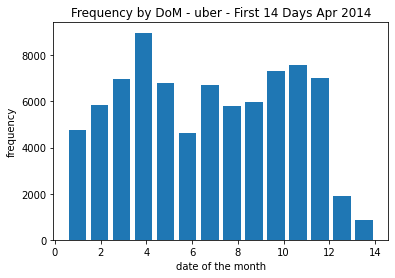

In [10]:
hist(data.dom, bins=14, rwidth=0.8, range=(0.5, 14))
xlabel('date of the month')
ylabel('frequency')
title('Frequency by DoM - uber - First 14 Days Apr 2014')

In [11]:
by_date = data.groupby('dom').apply(len)

In [12]:
by_date

dom
1     4749
2     5862
3     6981
4     8978
5     6817
6     4648
7     6712
8     5804
9     5979
10    7335
11    7575
12    6995
13    1883
14     854
15    1391
16    1059
17    1343
18     953
19     851
20     615
21     744
22     959
23    1196
24    1394
25    1410
26    1418
27     848
28     971
29    1487
30    2186
dtype: int64

<BarContainer object of 30 artists>

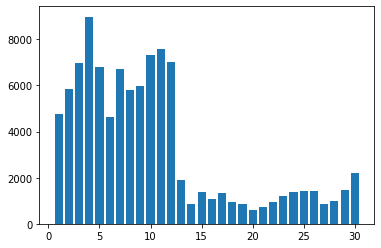

In [13]:
bar(range(1, 31), by_date)

In [14]:
by_date_sorted = by_date.sort_values()
by_date_sorted

dom
20     615
21     744
27     848
19     851
14     854
18     953
22     959
28     971
16    1059
23    1196
17    1343
15    1391
24    1394
25    1410
26    1418
29    1487
13    1883
30    2186
6     4648
1     4749
8     5804
2     5862
9     5979
7     6712
5     6817
3     6981
12    6995
10    7335
11    7575
4     8978
dtype: int64

Text(0.5, 1.0, 'Frequency by DoM - uber - Apr 2014')

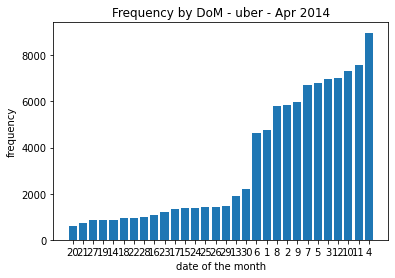

In [15]:
bar(range(1,31), by_date_sorted)
xticks(range(1,31), by_date_sorted.index)
xlabel('date of the month')
ylabel('frequency')
title('Frequency by DoM - uber - Apr 2014')

In [16]:
##ANALYSING HOURS

(array([1379.,  811.,  850., 1026., 1586., 3381., 4387., 3916.,    0.,
        3051., 3080., 3280., 3472., 4029., 4776., 6219., 7477., 8266.,
        7853., 6964., 6241., 6460., 5475., 3725.,    0.]),
 array([ 0.5 ,  1.44,  2.38,  3.32,  4.26,  5.2 ,  6.14,  7.08,  8.02,
         8.96,  9.9 , 10.84, 11.78, 12.72, 13.66, 14.6 , 15.54, 16.48,
        17.42, 18.36, 19.3 , 20.24, 21.18, 22.12, 23.06, 24.  ]),
 <BarContainer object of 25 artists>)

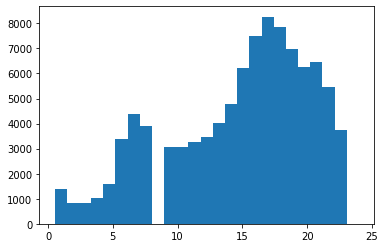

In [17]:
hist(data.hour, bins=25, range=(.5, 24))

In [18]:
##ANALYSING WEEKDAY

([<matplotlib.axis.XTick at 0x2a09339bd30>,
 [Text(0, 0, 'Mon'),
  Text(1, 0, 'Tue'),
  Text(2, 0, 'Wed'),
  Text(3, 0, 'Thu'),
  Text(4, 0, 'Fri'),
  Text(5, 0, 'Sat'),
  Text(6, 0, 'Sun')])

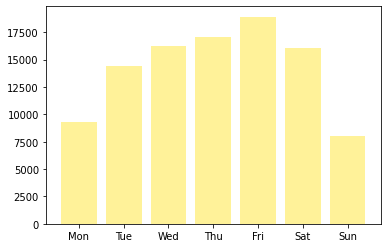

In [19]:
hist(data.weekday, bins=7, range =(-.5,6.5), rwidth=.8, color='#FFDF00', alpha=.4)
xticks(range(7), 'Mon Tue Wed Thu Fri Sat Sun'.split())

In [20]:
##CROSS ANALYSIS

<AxesSubplot:xlabel='hour', ylabel='weekday'>

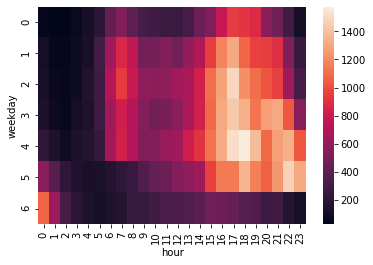

In [21]:
by_cross = data.groupby('weekday hour'.split()).apply(len).unstack()
seaborn.heatmap(by_cross)

In [22]:
#Plotting the map using the latitude and longitudes

(40.7, 41.0)

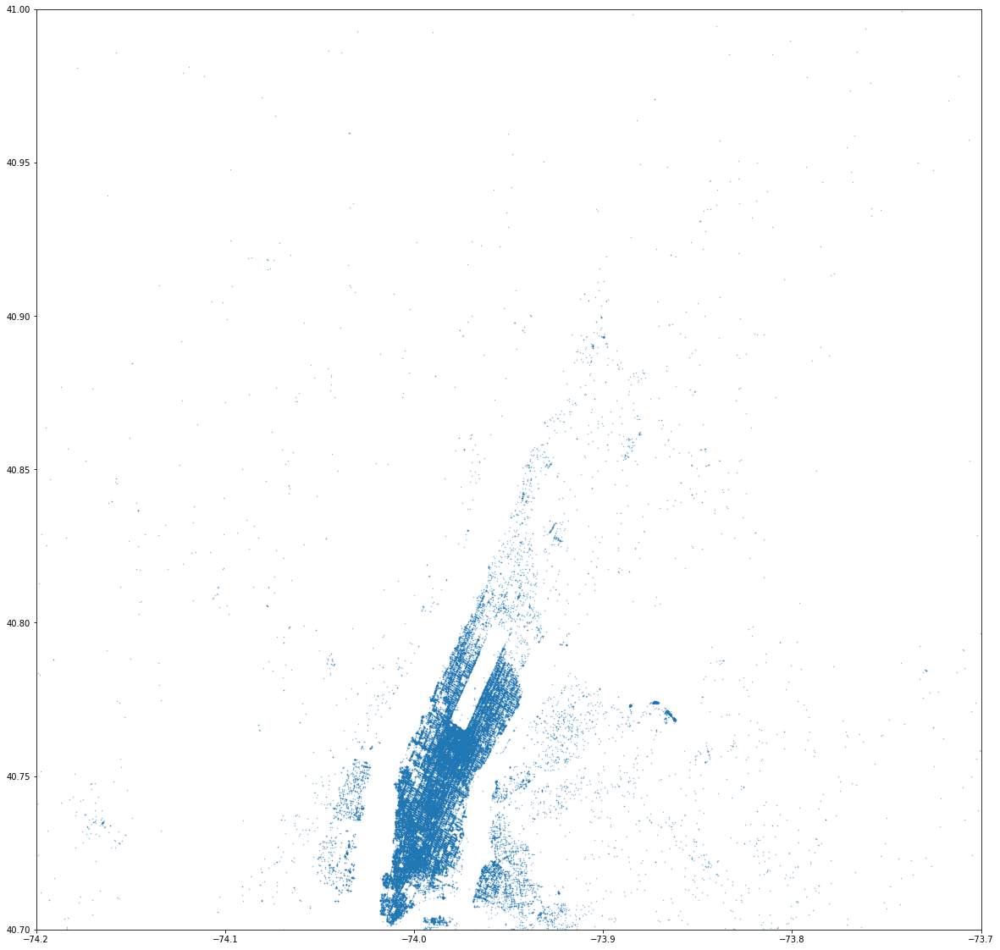

In [23]:
figure(figsize=(20, 20))
plot(data['Lon'], data['Lat'], '.', ms=1, alpha=.5)
xlim(-74.2, -73.7)
ylim(40.7, 41)